# Hito 5- Transform Coding for Redundancy Removal

En este hito se verán las curvas RD (muestran la distorsión creada a la hora de cuantizar en relación a los kbits enviados en cierto tiempo). Se ha usado la canción de: AviadorDro_LaZonaFantasma durante 20s para tener más muestras con las que trabajar. 

Este proceso se ha automatizado para así facilitar la creación de las curvas RD.

In [2]:
import os

def find_project_root(start_path=None, marker="TecMul_Intercom"):
    """
    Dynamically find the project root by looking for a known directory or file.
    
    :param start_path: Starting path for the search (defaults to current working directory).
    :param marker: A directory or file that indicates the project root (e.g., 'src', '.git').
    :return: The absolute path to the project root.
    """
    if start_path is None:
        start_path = os.getcwd()
    
    current_path = start_path
    while True:
        if os.path.isdir(os.path.join(current_path, marker)) or os.path.exists(os.path.join(current_path, marker)):
            return current_path
        parent_path = os.path.abspath(os.path.join(current_path, os.pardir))
        if current_path == parent_path:  # Reached the root of the filesystem
            raise RuntimeError(f"Could not find project root containing '{marker}'.")
        current_path = parent_path
        
project_root = find_project_root(marker="src")
os.chdir(project_root)

Se hace uso de la librería subprocess para poder ejecutar en segundo plano todos los scripts. 

In [3]:
import math
import subprocess
import logging
import os
import sys
import numpy as np
import matplotlib.pyplot as plt

class Processing:
    def __init__(self):
        self.quant = ["1", "2", "4", "8", "16", "32", "64", "128", "256", "512", "1024", "2048", "4096", "8182"]
        self.wavelets = ["db1", "db2", "db3", "db4", "db5", "sym4", "sym5", "bior3.3", "bior3.5"]
        self.levels = ["1", "2", "3", "4", "5", "6"]

    def call_temporal_script_no_overlapping_16(self, quant, wavelet, level):
        """
        Calls the 'temporal_no_overlapped_DWT_coding_16.py' script using subprocess,
        and saves the output to a specified file.

        :param quant: Quantization value (string).
        :param wavelet: Wavelet type (string).
        :param level: Level value (string).
        :param output_file: Path to the output text file.
        """
        starting_path= os.getcwd()
        script_path=os.path.join(starting_path, "src", "temporal_no_overlapped_DWT_coding_16.py")
        executorpy=sys.executable
        filesong=os.path.join(starting_path, "data", "AviadorDro_LaZonaFantasma.oga")
        try:
            # Command to execute the script with parameters
            cmd = [
                executorpy, 
                script_path,
                "-q", quant,
                "-w", wavelet,
                "-e", level,
                "--show_stats",
                "-f", filesong,
                "-t","20"
            ]

            # Run the command
            result =subprocess.run(cmd, capture_output=True, text=True)
            if result.returncode == 0:
                return result.stdout
            else:
            # Log and process errors if the script failed
                logging.error(f"Script failed with error:\n{result.stderr}")
                return None
        except Exception as e:
            logging.error(f"An error occurred: {e}")

    def call_script_MST_16(self, quant):
        """
        Calls the 'stereo_MST_coding_16.py' script using subprocess,
        and saves the output to a specified file.

        :param quant: Quantization value (string).
        :param wavelet: Wavelet type (string).
        :param level: Level value (string).
        :param output_file: Path to the output text file.
        """
        starting_path= os.getcwd()
        script_path=os.path.join(starting_path, "src", "stereo_MST_coding_16.py")
        executorpy=sys.executable
        filesong=os.path.join(starting_path, "data", "AviadorDro_LaZonaFantasma.oga")
        try:
            # Command to execute the script with parameters
            cmd = [
                executorpy, 
                script_path,
                "-q", quant,
                "--show_stats",
                "-f", filesong,
                "-t","20"
            ]

            # Run the command
            result =subprocess.run(cmd, capture_output=True, text=True)
            if result.returncode == 0:
                return result.stdout
            else:
            # Log and process errors if the script failed
                logging.error(f"Script failed with error:\n{result.stderr}")
                return None
        except Exception as e:
            logging.error(f"An error occurred: {e}")
    
    def call_script_MST_32(self, quant):
        """
        Calls the 'stereo_MST_coding_32.py' script using subprocess,
        and saves the output to a specified file.

        :param quant: Quantization value (string).
        :param wavelet: Wavelet type (string).
        :param level: Level value (string).
        :param output_file: Path to the output text file.
        """
        starting_path= os.getcwd()
        script_path=os.path.join(starting_path, "src", "stereo_MST_coding_32.py")
        executorpy=sys.executable
        filesong=os.path.join(starting_path, "data", "AviadorDro_LaZonaFantasma.oga")
        try:
            # Command to execute the script with parameters
            cmd = [
                executorpy, 
                script_path,
                "-q", quant,
                "--show_stats",
                "-f", filesong,
                "-t","20"
            ]

            # Run the command
            result =subprocess.run(cmd, capture_output=True, text=True)
            if result.returncode == 0:
                return result.stdout
            else:
            # Log and process errors if the script failed
                logging.error(f"Script failed with error:\n{result.stderr}")
                return None
        except Exception as e:
            logging.error(f"An error occurred: {e}")
    
    def call_temporal_script_no_overlapping_32(self, quant, wavelet, level):
        """
        Calls the 'temporal_no_overlapped_DWT_coding_32.py' script using subprocess,
        and saves the output to a specified file.

        :param quant: Quantization value (string).
        :param wavelet: Wavelet type (string).
        :param level: Level value (string).
        :param output_file: Path to the output text file.
        """
        starting_path= os.getcwd()
        script_path=os.path.join(starting_path, "src", "temporal_no_overlapped_DWT_coding_32.py")
        executorpy=sys.executable
        filesong=os.path.join(starting_path, "data", "AviadorDro_LaZonaFantasma.oga")
        try:
            # Command to execute the script with parameters
            cmd = [
                executorpy, 
                script_path,
                "-q", quant,
                "-w", wavelet,
                "-e", level,
                "--show_stats",
                "-f", filesong,
                "-t","20"
            ]

            # Run the command
            result =subprocess.run(cmd, capture_output=True, text=True)
            if result.returncode == 0:
                return result.stdout
            else:
            # Log and process errors if the script failed
                logging.error(f"Script failed with error:\n{result.stderr}")
                return None

        except Exception as e:
            logging.error(f"An error occurred: {e}")

    def call_temporal_script_overlapping(self, quant, wavelet, level):
        """
        Calls the 'temporal_overlapped_DWT_coding.py' script using subprocess,
        and saves the output to a specified file.

        :param quant: Quantization value (string).
        :param wavelet: Wavelet type (string).
        :param level: Level value (string).
        :param output_file: Path to the output text file.
        """
        starting_path= os.getcwd()
        script_path=os.path.join(starting_path, "src", "temporal_overlapped_DWT_coding.py")
        executorpy=executorpy=sys.executable
        filesong=os.path.join(starting_path, "data", "AviadorDro_LaZonaFantasma.oga")
        try:
            # Command to execute the script with parameters
            cmd = [
                executorpy, 
                script_path,
                "-q", quant,
                "-w", wavelet,
                "-e", level,
                "--show_stats",
                "-f", filesong,
                "-t","20"
            ]

            # Run the command
            result =subprocess.run(cmd, capture_output=True, text=True)
            if result.returncode == 0:
            # Process the captured standard output
                logging.info(f"Script output:\n{result.stdout}")
                return result.stdout
            else:
            # Log and process errors if the script failed
                logging.error(f"Script failed with error:\n{result.stderr}")
                return None
        except Exception as e:
            logging.error(f"An error occurred: {e}")

# Logging setup
logging.basicConfig(level=logging.INFO)

## Determine the RD curves for the MST:

En esta primera sección del hito se verán las curvas RD para los métodos:
- stereo_MST_coding_16 
- stereo_MST_coding_32

### Coding- MST 16

Se itera por el array de cuantizaciones, y se consigue en el output que da el subprocess el "payload sent average" y el RMSE (al que se hace la media).

In [4]:
# Initialize the processor
processor = Processing()

points = []  # Initialize points

for quant in processor.quant:

    output = processor.call_script_MST_16(quant)

    if output:
        lines = output.splitlines()
        payload_sent_average = None
        average_rmse = None

        for line in lines:
            if "Payload sent average " in line:
                payload_sent_average = float(line.split("=")[1].strip().split()[0])
            elif "Average RMSE (Root Mean Square Error) per sample " in line:
                numbers_str = line.split("=")[1].strip().strip("[]")
                numbers = [float(num) for num in numbers_str.split()]
                average_rmse = sum(numbers) / len(numbers) if numbers else None

        if payload_sent_average is not None and average_rmse is not None:
            points.append((payload_sent_average, average_rmse))
        else:
            logging.warning(f"Missing data for quant={quant}. Skipping this point.")

if points:
    points = sorted(points)

logging.info("Data collection completed.")

INFO:root:Data collection completed.


In [5]:
# Save points_per_wavelet for later use
import pickle

with open("points_mst_16.pkl", "wb") as f:
    pickle.dump(points, f)

print("Data saved to 'points_mst_16.pkl'.")

Data saved to 'points_mst_16.pkl'.


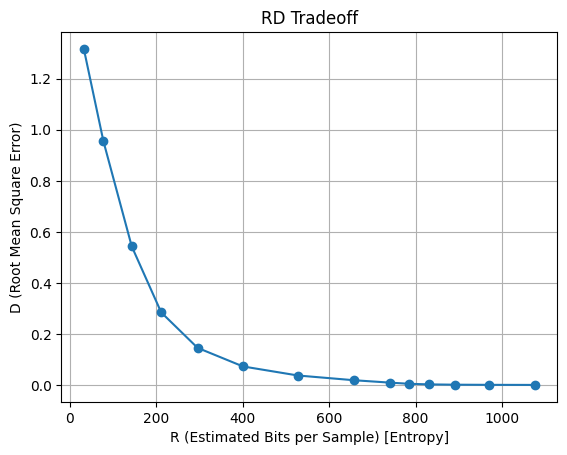

In [6]:
# Load points
import pickle

with open("points_mst_16.pkl", "rb") as f:
    points  = pickle.load(f)

plt.figure()
plt.title("RD Tradeoff")
plt.xlabel("R (Estimated Bits per Sample) [Entropy]")
plt.ylabel("D (Root Mean Square Error)")
plt.grid(True)

if points:
    plt.plot(*zip(*points), marker="o", linestyle="-")
plt.show()

La figura de arriba es la curva RD, y por lo que se ve, con -q 8192 se consigue menos de 50kbits enviados y un RMSE>1'2.

### Coding- MST 32

Se realiza lo mismo que con MST 16.

In [7]:
# Initialize the processor
processor = Processing()

points = []  # Initialize points

for quant in processor.quant:

    output = processor.call_script_MST_32(quant)

    if output:
        lines = output.splitlines()
        payload_sent_average = None
        average_rmse = None

        for line in lines:
            if "Payload sent average " in line:
                payload_sent_average = float(line.split("=")[1].strip().split()[0])
            elif "Average RMSE (Root Mean Square Error) per sample " in line:
                numbers_str = line.split("=")[1].strip().strip("[]")
                numbers = [float(num) for num in numbers_str.split()]
                average_rmse = sum(numbers) / len(numbers) if numbers else None

        if payload_sent_average is not None and average_rmse is not None:
            points.append((payload_sent_average, average_rmse))
        else:
            logging.warning(f"Missing data for quant={quant}. Skipping this point.")

if points:
    points = sorted(points)

logging.info("Data collection completed.")

INFO:root:Data collection completed.


In [8]:
# Save points_per_wavelet for later use
import pickle

with open("points_mst_32.pkl", "wb") as f:
    pickle.dump(points, f)

print("Data saved to 'points_mst_32.pkl'.")

Data saved to 'points_mst_32.pkl'.


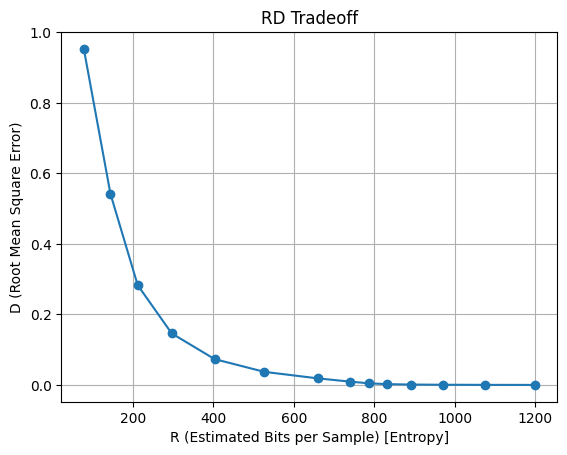

In [9]:
# Load points
import pickle

with open("points_mst_32.pkl", "rb") as f:
    points  = pickle.load(f)

plt.figure()
plt.title("RD Tradeoff")
plt.xlabel("R (Estimated Bits per Sample) [Entropy]")
plt.ylabel("D (Root Mean Square Error)")
plt.grid(True)

if points:
    plt.plot(*zip(*points), marker="o", linestyle="-")
plt.show()

Curva RD. Con -q 8192 se tiene un valor más cercano a 50kbits (comparado con MST 16) y mayor distorsión (RMSE=1'75).

### Conclusión

Comparando las curvas RD entre MST 16 y MST 32, se puede ver que MST 16 es mejor a la hora de comprimir y no genera tanta distorsión.
Esto se debe a que cuando se hace el análisis, en MST 16 se la división de mid y size (a la mitad), mientras que en MST 32 no se hace esa división en el análisis.

## Determine the RD curves for the DWT

### Coding- NO overlapped (using MST 16)

In [10]:
# Initialize the processor
processor = Processing()

# Define maximum levels for each wavelet type

max_levels_per_wavelet = {
    "db1": 10, "db2": 10, "db3": 10, "db4": 10, "db5": 10,
    "sym4": 5, "sym5":5, "bior3.3":5, "bior3.5":5
}


# Data storage
points_per_wavelet = {}  # To store points for each wavelet and level

# Iterate through combinations with constraint on levels
for wavelet in processor.wavelets:
    max_level = max_levels_per_wavelet.get(wavelet, 2)  # Default to 2 if undefined
    points_per_wavelet[wavelet] = {}

    for level in processor.levels:
        if int(level) > max_level:
            continue

        if wavelet in ["sym4", "sym5", "bior3.3", "bior3.5"] and (int(level) < 4 or int(level) > 5):
            continue

        points = []  # Initialize points for this level

        for quant in processor.quant:

            output = processor.call_temporal_script_no_overlapping_16(quant, wavelet, level)

            if output:
                lines = output.splitlines()
                payload_sent_average = None
                average_rmse = None

                for line in lines:
                    if "Payload sent average " in line:
                        payload_sent_average = float(line.split("=")[1].strip().split()[0])
                    elif "Average RMSE (Root Mean Square Error) per sample " in line:
                        numbers_str = line.split("=")[1].strip().strip("[]")
                        numbers = [float(num) for num in numbers_str.split()]
                        average_rmse = sum(numbers) / len(numbers) if numbers else None

                if payload_sent_average is not None and average_rmse is not None:
                    points.append((payload_sent_average, average_rmse))
                else:
                    logging.warning(f"Missing data for quant={quant}. Skipping this point.")

        if points:
            points = sorted(points)
            points_per_wavelet[wavelet][level] = points

logging.info("Data collection completed.")

INFO:root:Data collection completed.


In [11]:
# Save points_per_wavelet for later use
import pickle

with open("points_per_wavelet_nol16.pkl", "wb") as f:
    pickle.dump(points_per_wavelet, f)

print("Data saved to 'points_per_wavelet_nol16.pkl'.")

Data saved to 'points_per_wavelet_nol16.pkl'.


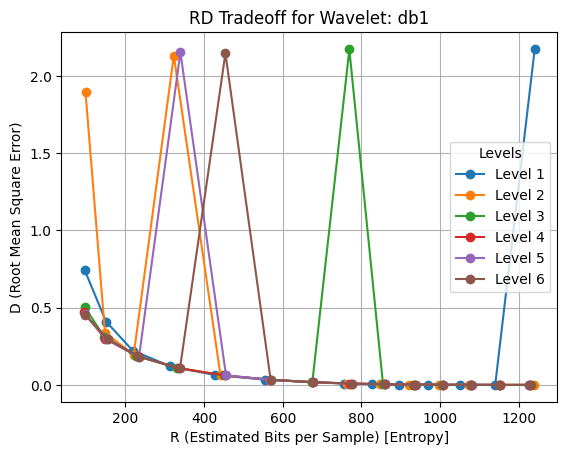

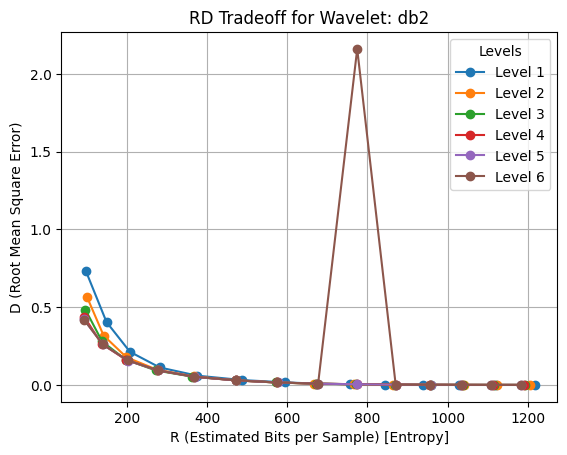

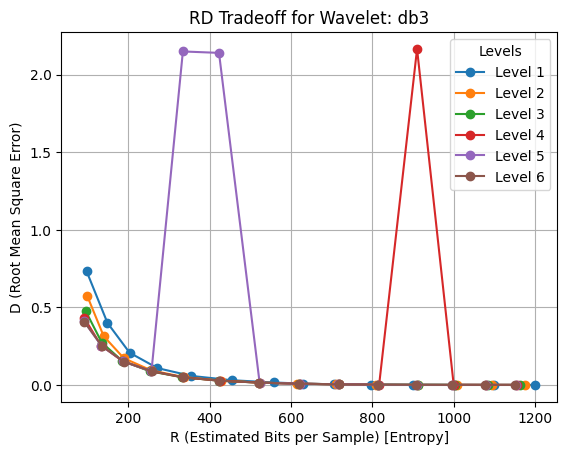

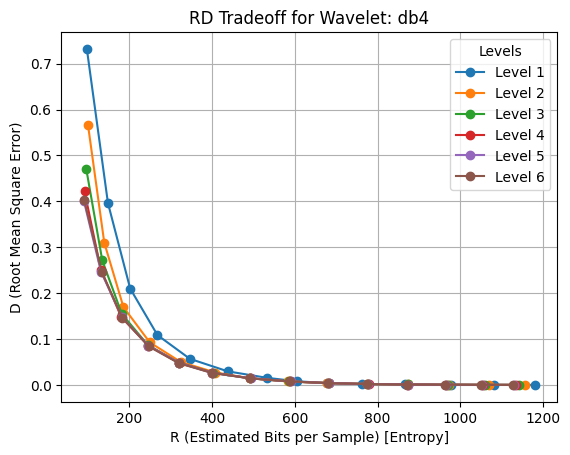

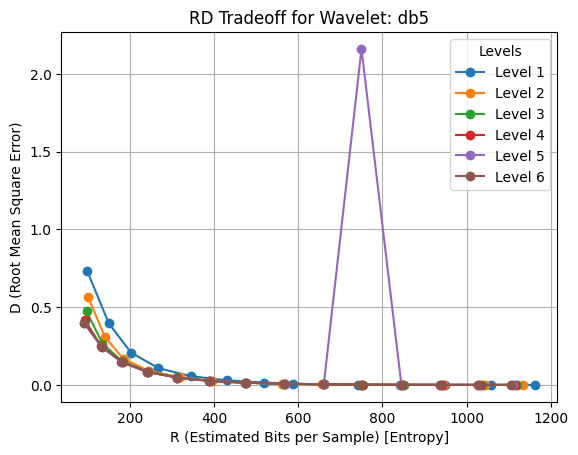

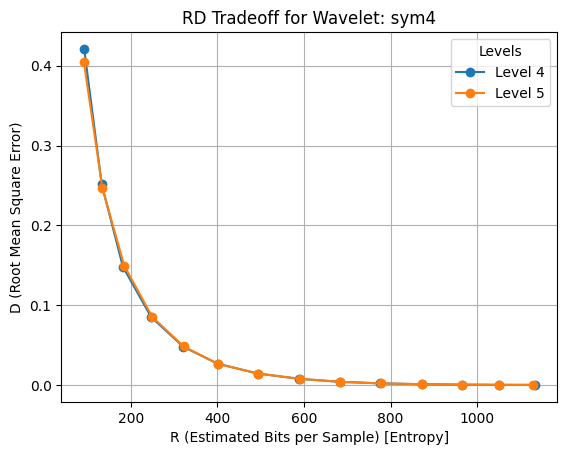

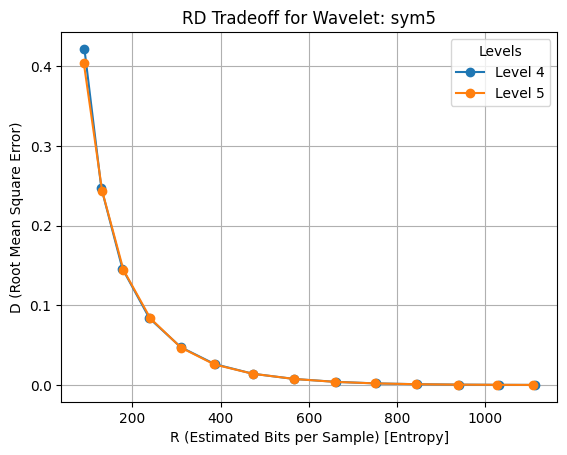

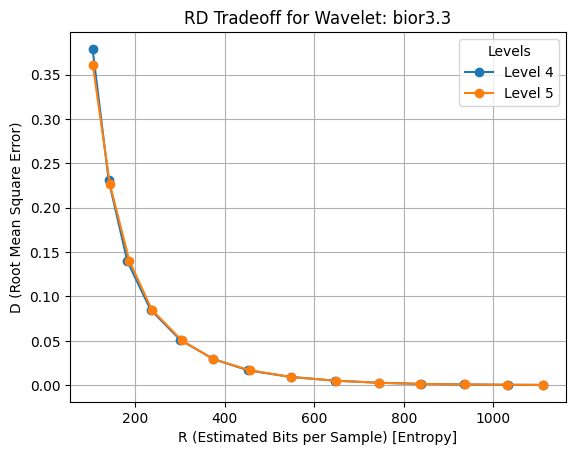

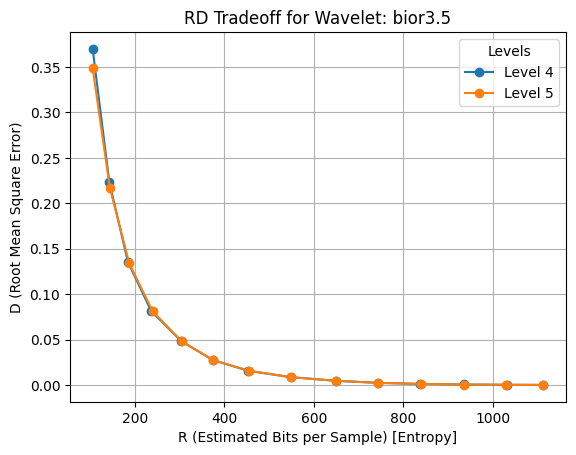

In [12]:
# Load points_per_wavelet
import pickle

with open("points_per_wavelet_nol16.pkl", "rb") as f:
    points_per_wavelet = pickle.load(f)

# Generate plots
for wavelet, levels_data in points_per_wavelet.items():
    plt.figure()
    plt.title(f"RD Tradeoff for Wavelet: {wavelet}")
    plt.xlabel("R (Estimated Bits per Sample) [Entropy]")
    plt.ylabel("D (Root Mean Square Error)")
    plt.grid(True)

    for level, points in levels_data.items():
        if points:
            plt.plot(*zip(*points), marker="o", linestyle="-", label=f"Level {level}")

    plt.legend(title="Levels")
    plt.show()

### Coding- NO overlapped (using MST 32)

In [13]:
# Initialize the processor
processor = Processing()

max_levels_per_wavelet = {
    "db1": 10, "db2": 10, "db3": 10, "db4": 10, "db5": 10,
    "sym4": 5, "sym5":5, "bior3.3":5, "bior3.5":5
}

# Data storage
points_per_wavelet = {}  # To store points for each wavelet and level

# Iterate through combinations with constraint on levels
for wavelet in processor.wavelets:
    max_level = max_levels_per_wavelet.get(wavelet, 2)  # Default to 2 if undefined
    points_per_wavelet[wavelet] = {}

    for level in processor.levels:
        if int(level) > max_level:
            continue

        if wavelet in ["sym4", "sym5", "bior3.3", "bior3.5"] and (int(level) < 4 or int(level) > 5):
            continue

        points = []  # Initialize points for this level

        for quant in processor.quant:

            output = processor.call_temporal_script_no_overlapping_32(quant, wavelet, level)
            
            if output:
                lines = output.splitlines()
                payload_sent_average = None
                average_rmse = None

                for line in lines:
                    if "Payload sent average " in line:
                        payload_sent_average = float(line.split("=")[1].strip().split()[0])
                    elif "Average RMSE (Root Mean Square Error) per sample " in line:
                        numbers_str = line.split("=")[1].strip().strip("[]")
                        numbers = [float(num) for num in numbers_str.split()]
                        average_rmse = sum(numbers) / len(numbers) if numbers else None

                if payload_sent_average is not None and average_rmse is not None:
                    points.append((payload_sent_average, average_rmse))
                else:
                    logging.warning(f"Missing data for quant={quant}. Skipping this point.")

        if points:
            points = sorted(points)
            points_per_wavelet[wavelet][level] = points

logging.info("Data collection completed.")

INFO:root:Data collection completed.


In [14]:
# Save points_per_wavelet for later use
import pickle

with open("points_per_wavelet_nol32.pkl", "wb") as f:
    pickle.dump(points_per_wavelet, f)

print("Data saved to 'points_per_wavelet_nol32.pkl'.")

Data saved to 'points_per_wavelet_nol32.pkl'.


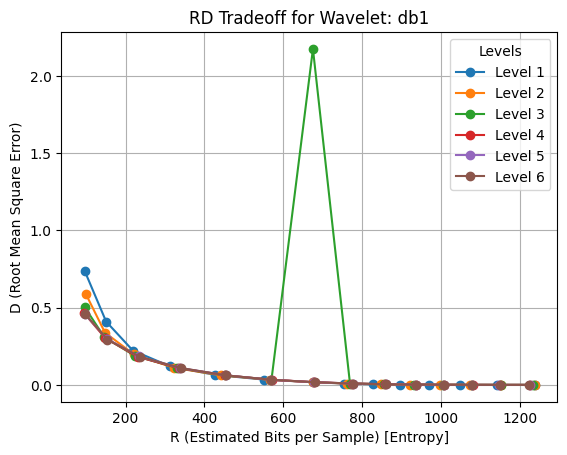

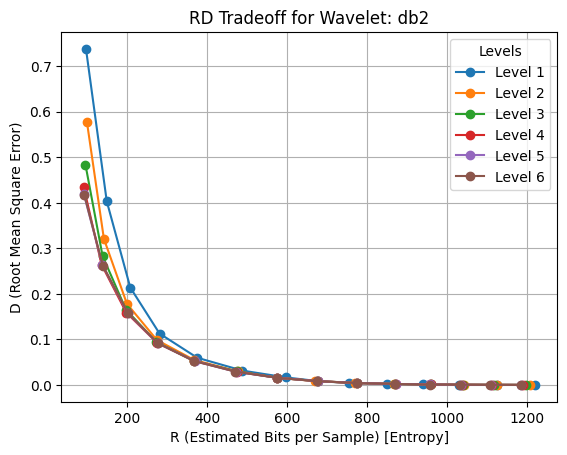

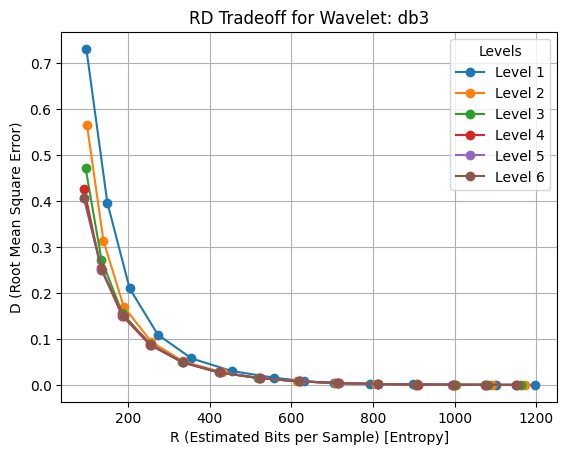

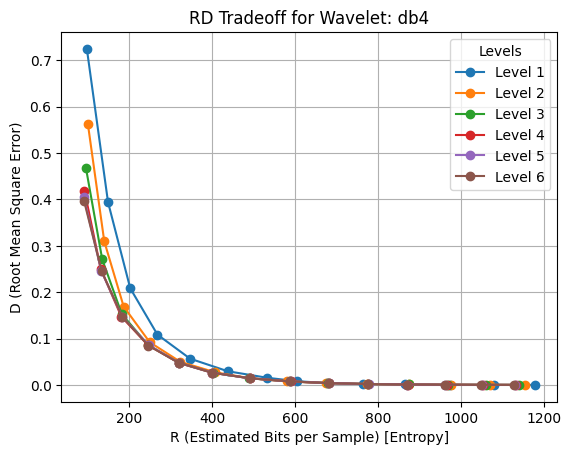

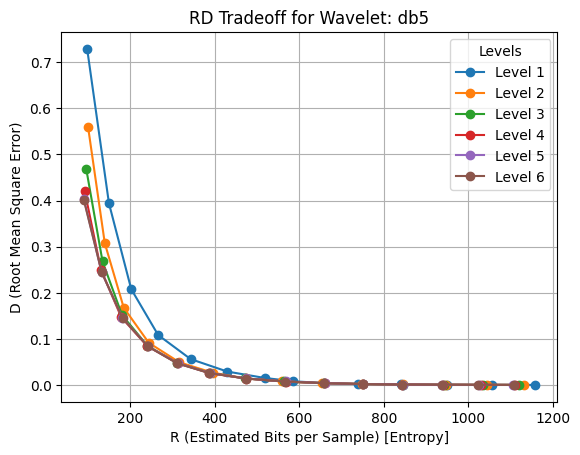

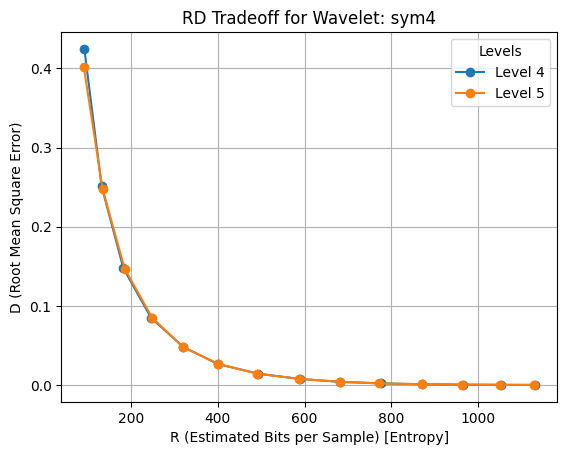

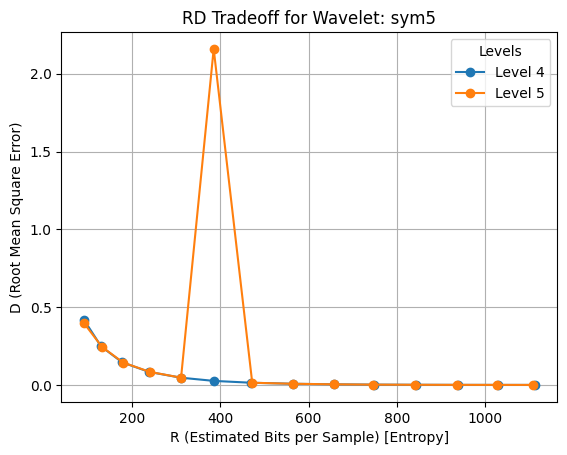

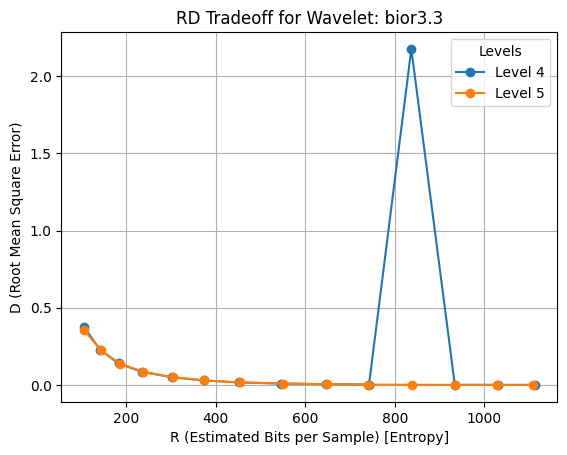

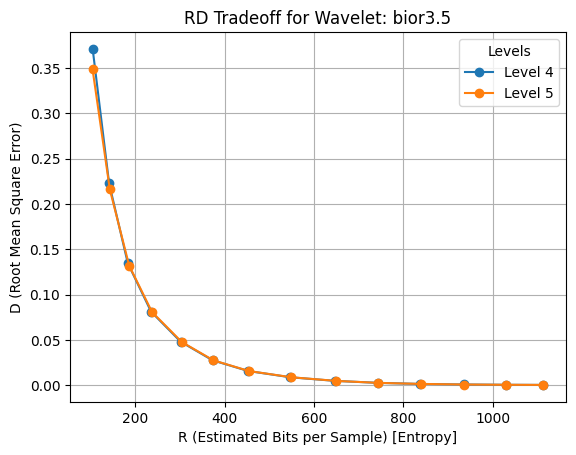

In [15]:
# Load points_per_wavelet
import pickle

with open("points_per_wavelet_nol32.pkl", "rb") as f:
    points_per_wavelet = pickle.load(f)

# Generate plots
for wavelet, levels_data in points_per_wavelet.items():
    plt.figure()
    plt.title(f"RD Tradeoff for Wavelet: {wavelet}")
    plt.xlabel("R (Estimated Bits per Sample) [Entropy]")
    plt.ylabel("D (Root Mean Square Error)")
    plt.grid(True)

    for level, points in levels_data.items():
        if points:
            plt.plot(*zip(*points), marker="o", linestyle="-", label=f"Level {level}")

    plt.legend(title="Levels")
    plt.show()

### Coding- overlapped

In [4]:
# Initialize the processor
processor = Processing()

# Define maximum levels for each wavelet type

max_levels_per_wavelet = {
    "db1": 9, "db2": 8, "db3": 7, "db4": 7, "db5": 6,
    "sym4": 5, "sym5":5, "bior3.3":5, "bior3.5":5
}


# Data storage
points_per_wavelet = {}  # To store points for each wavelet and level

# Iterate through combinations with constraint on levels
for wavelet in processor.wavelets:
    max_level = max_levels_per_wavelet.get(wavelet, 2)  # Default to 2 if undefined
    points_per_wavelet[wavelet] = {}

    for level in processor.levels:
        if int(level) > max_level:
            continue

        if wavelet in ["sym4", "sym5", "bior3.3", "bior3.5"] and (int(level) < 4 or int(level) > 5):
            continue

        points = []  # Initialize points for this level

        for quant in processor.quant:

            output = processor.call_temporal_script_overlapping(quant, wavelet, level)

            if output:
                lines = output.splitlines()
                payload_sent_average = None
                average_rmse = None

                for line in lines:
                    if "Payload sent average " in line:
                        payload_sent_average = float(line.split("=")[1].strip().split()[0])
                    elif "Average RMSE (Root Mean Square Error) per sample " in line:
                        numbers_str = line.split("=")[1].strip().strip("[]")
                        numbers = [float(num) for num in numbers_str.split()]
                        average_rmse = sum(numbers) / len(numbers) if numbers else None

                if payload_sent_average is not None and average_rmse is not None:
                    points.append((payload_sent_average, average_rmse))
                else:
                    logging.warning(f"Missing data for quant={quant}. Skipping this point.")

        if points:
            points = sorted(points)
            points_per_wavelet[wavelet][level] = points

logging.info("Data collection completed.")

INFO:root:Processing wavelet=db1, level=1
INFO:root:Script output:
pygame 2.6.0 (SDL 2.28.4, Python 3.12.6)
Hello from the pygame community. https://www.pygame.org/contribute.html

InterCom parameters:

Namespace(input_device=None, output_device=None, list_devices=False, frames_per_second=44100, frames_per_chunk=1024, listening_port=4444, destination_address='localhost', destination_port=4444, filename='c:\\Users\\ggracoon\\Documents\\UNI\\Tercero\\1_TM\\TecMul_InterCom\\data\\AviadorDro_LaZonaFantasma.oga', reading_time=20, number_of_channels=2, show_stats=True, show_samples=False, show_spectrum=False, buffering_time=150, minimal_quantization_step_size=1, rate_control_period=1, wavelet_name='db1', levels='1')

Using device:

   0 Asignador de sonido Microsoft - Input, MME (2 in, 0 out)
>  1 Headset Microphone (Realtek(R) , MME (2 in, 0 out)
   2 Varios micrÃ³fonos (IntelÂ® Smart, MME (4 in, 0 out)
   3 Asignador de sonido Microsoft - Output, MME (0 in, 2 out)
<  4 Headphone (Realtek(R

In [5]:
# Save points_per_wavelet for later use
import pickle

with open("points_per_wavelet_ol.pkl", "wb") as f:
    pickle.dump(points_per_wavelet, f)

print("Data saved to 'points_per_wavelet_ol.pkl'.")

Data saved to 'points_per_wavelet_ol.pkl'.


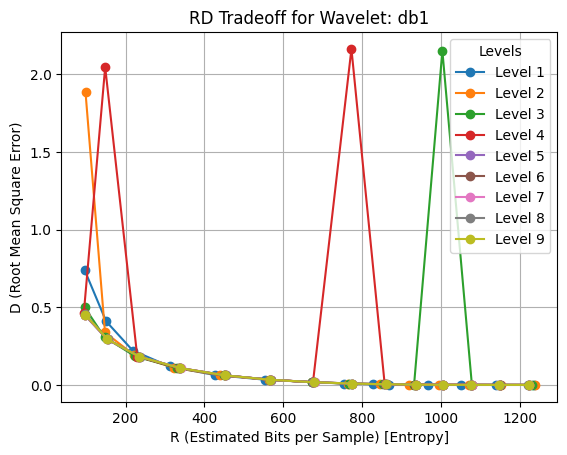

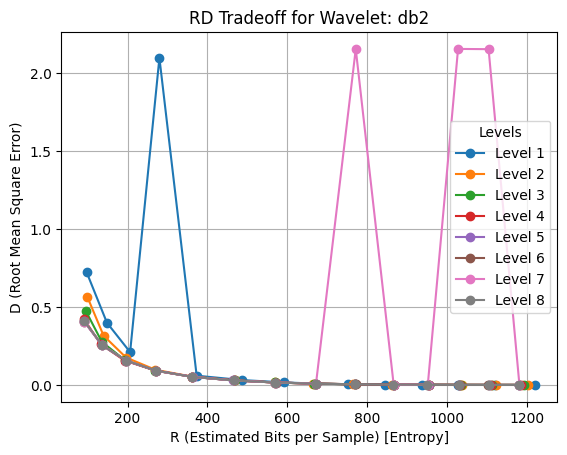

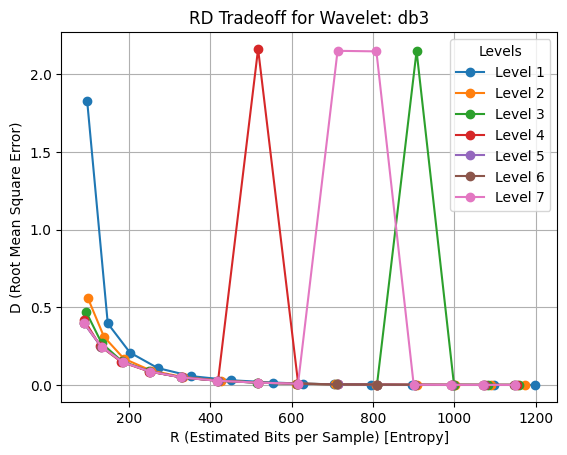

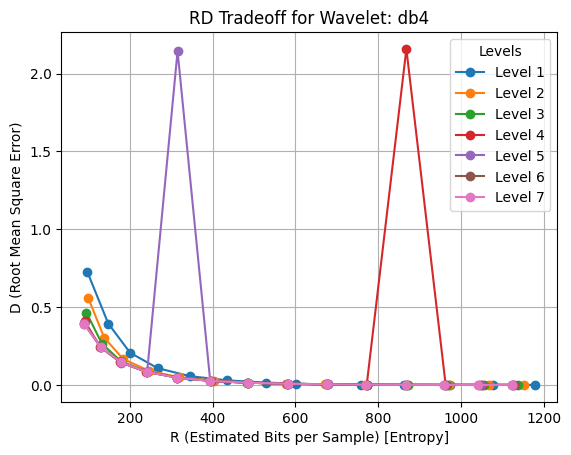

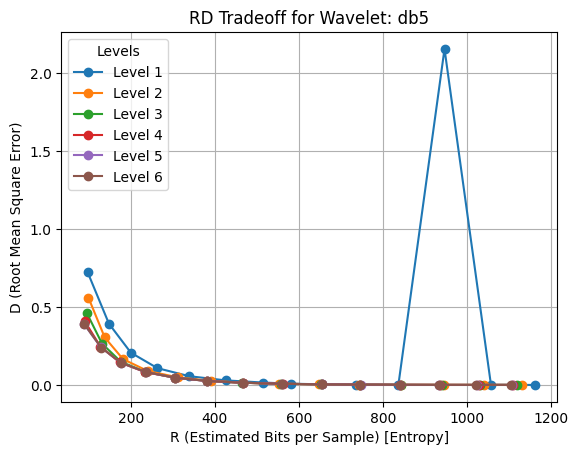

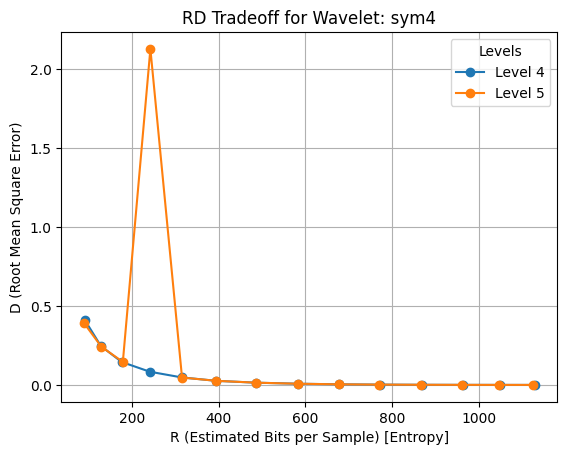

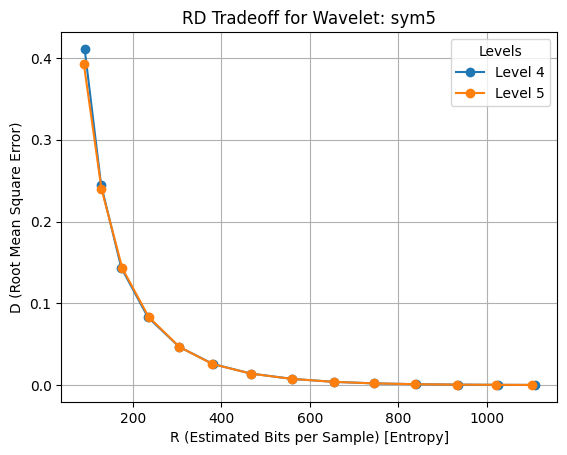

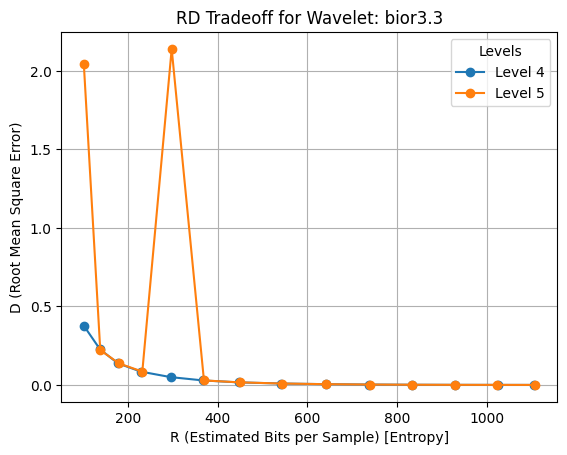

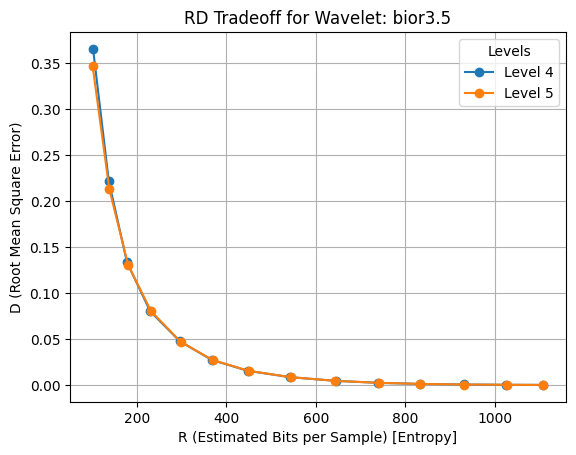

In [6]:
# Load points_per_wavelet
import pickle

with open("points_per_wavelet_ol.pkl", "rb") as f:
    points_per_wavelet = pickle.load(f)

# Generate plots
for wavelet, levels_data in points_per_wavelet.items():
    plt.figure()
    plt.title(f"RD Tradeoff for Wavelet: {wavelet}")
    plt.xlabel("R (Estimated Bits per Sample) [Entropy]")
    plt.ylabel("D (Root Mean Square Error)")
    plt.grid(True)

    for level, points in levels_data.items():
        if points:
            plt.plot(*zip(*points), marker="o", linestyle="-", label=f"Level {level}")

    plt.legend(title="Levels")
    plt.show()

### Conclusión

La latencia para poder realizar las transformadas y los filtros es lo suficientemente baja para que en tiempo real no se note. No parece incrementar el jitter significativamente tampoco, lo que hace que DWT sea una manera de reducir la redundancia, controlando el bit-rate y que se oiga de manera aceptable. 

Se han probado también otras familias de wavelets, como symlets y biorthogonal. Las dos últimas son excepcionalmente mejores a la hora de eliminar distorsión con grandes cuantizaciones, ya que siempre se quedan por debajo de 0'5, no como con la familia de daubechies, que aunque no supere una distorsión de 1, sigue siendo mayor a 0'7.

Esto sucede porque los symlets son más simétricos que Daubechies, que ayuda a reducir la distorsión.
Por otro lado, los biortogonales tienen una fase lineal, por lo que guardan los alineamientos en las señales mejor. Estos wavelets también son duales (no tienen que ser exactamente idénticas), haciendo que sean más flexibles. 

## Answer the questions

*Which other transform(s) are used in audio encoding systems (such as MP3) to exploit temporal redundancy? Enumerate the systems and the transform(s) used.*

Para MP3 se usan transformadas como MDCT (**m**odified **d**iscrete **c**osine **t**ransform) que se usa para bloques de un dataset consecutivos, siendo que estos bloques se sobreponen entre sí (las mitades). Esto se usa para transformar las señales de audio en señales en frecuencia. Además, MDCT se puede adaptar a la estructura temporal del audio (explota la redundancia temporal).

También se usan bancos de filtros, llamado PFB (**p**olyphase **f**ilter **b**ank), que reduce las muestras de entrada de la señal en subbandas, para separar la señal en componentes con contenido en frecuencia que se solapen.
La diferencia entre PFB y MDCT es que la primera organiza la señal en fracciones más pequeñas y manejables, mientras que la última trabaja directamente sobre el dominio de la frecuencia. 

Para otros casos (no con MP3), pero si con códecs de voz (voice codecs), se usan LPC (**l**inear **p**redictive **c**oding), que sirve para predecir muestras de audio futuras basándose en muestras ya procesadas. Algunos voice codecs son: VoIP, conexiones móviles (3G, 4G, 5G), servicios de audio de streaming, y otros más.

Para las televisiones, por ejemplo, se usan tranformadas como TNS (**t**emporal **n**oise **s**haping) que optimizan el ruido distribuido en el tiempo por la cuantización. Este método controla la máscara temporal (temporal masking) y la redundancia.

## Conclusión (comparativa MST con DWT)

MST ha dado resultados buenos, pero comparado con DWT (que usa también MST) es comparablemente peor. 
DWT, en su rango de distorsión no supera un RMSE de 1, mientras que MST llega hasta 1'2 o más. 
DWT como se encarga de dividir las muestras, aplicar filtros y juntar las muestras, lo que hace que no se cree tanta distorsión a la hora de cuantizar. 
Por otro lado MST, si es de 16, aunque su cuantización sea únicamente de 1, su capacidad de compresión sigue siendo mayor (por la división al principio de mid y size), mientras que en los códigos de MST 32 y de DWT, para cuantización 1, ambos rondan los 1200 Kbits.

Por lo que, DWT es mejor que MST a la hora de eliminar distorsión cuando comprime, y MST 16, si se quiere mandar la señal con poca cuantización, mejora el bit-rate.